<a href="https://colab.research.google.com/github/G4CENeiz/PCVK_2024/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# D. Praktikum

## Step 2

In [1]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


## Step 3

In [2]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

 Mengubah tingkkat kecerahan citra 
-----------------------------------
Masukkan nilai kecerahan: 50


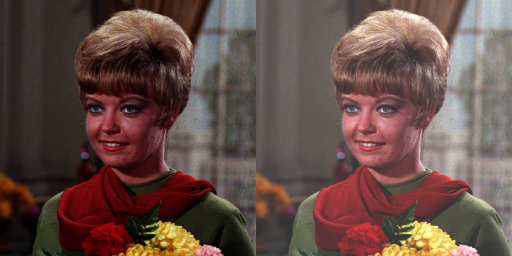

In [12]:
print(' Mengubah tingkat kecerahan citra ')
print('-----------------------------------')

try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

# brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_image))
cv2_imshow(final_frame)

# Assignment

## 1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

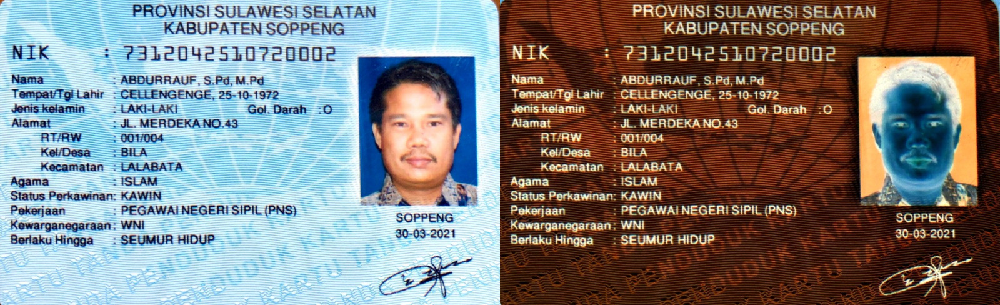

In [10]:
original = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP7.jpeg')
inverse_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      inverse_image[y,x,c] = 255 - original[y,x,c]

final_frame = cv.hconcat((original, inverse_image))
cv2_imshow(final_frame)

## 2. Implementasikan transformasi contrast pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga menghasilkan keluaran seperti berikut:

 Mengubah kontras citra 
------------------------
Masukkan tingkat kecerahan [-255 - 255]: 50
Masukkan kontras [1.0 - 3.0]: 2


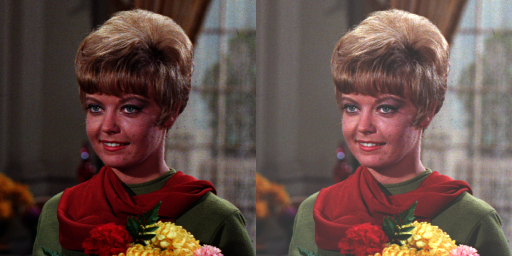

In [26]:
original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff')
contrast_image = np.zeros(original.shape, original.dtype)

print(' Mengubah kontras dan tingkat kecerahan citra ')
print('------------------------')

try:
  brightness = int(input('Masukkan tingkat kecerahan [-255 - 255]: '))
except ValueError:
  print('Error, not a number')

try:
  contrast = float(input('Masukkan kontras [1.0 - 3.0]: '))
except ValueError:
  print('Error, not a number')

factor = (259 * (contrast + 255)) / (255 * (259 - contrast))

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      new_value = factor * (original[y, x, c] - 128) + 128 + brightness
      contrast_image[y, x, c] = np.clip(new_value, 0, 255)

final_frame = cv.hconcat((original, contrast_image))
cv2_imshow(final_frame)

 ## 3. Implementasikan transformasi logarithmic brightness pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi log, sehingga menghasilkan keluaran seperti berikut:

 Mengubah tingkat kecerahan citra dengan transformasi log 
----------------------------------------------------------
Masukkan nilai kecerahan: 50


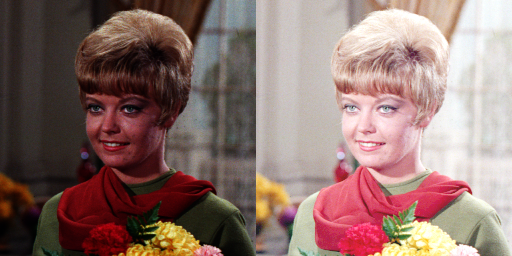

In [32]:
original = cv.imread('/content/drive/MyDrive/PCVK/Images/female.tiff')
logaritmic_image = np.zeros(original.shape, original.dtype)

print(' Mengubah tingkat kecerahan citra dengan transformasi log ')
print('----------------------------------------------------------')

try:
  brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
  print('Error, not a number')

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      logaritmic_image[y, x, c] = np.clip(brightness * np.log1p(original[y, x, c]) , 0, 255)

final_frame = cv.hconcat((original, logaritmic_image))
cv2_imshow(final_frame)

## 4. Implementasikan transformasi grayscale menggunakan metode averaging, lightness, dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

In [35]:
original = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP7.jpeg')

### a. Averaging

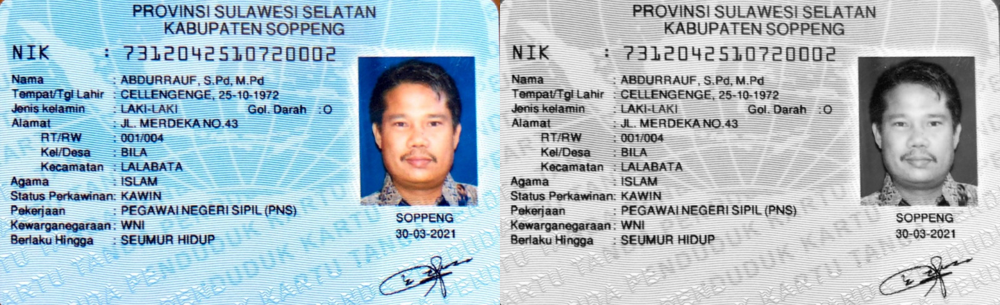

In [39]:
average_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      average_image[y, x, c] = np.average(original[y, x])

final_frame = cv.hconcat((original, average_image))
cv2_imshow(final_frame)

### b. Lightness

[ 21  77 156]
156
21


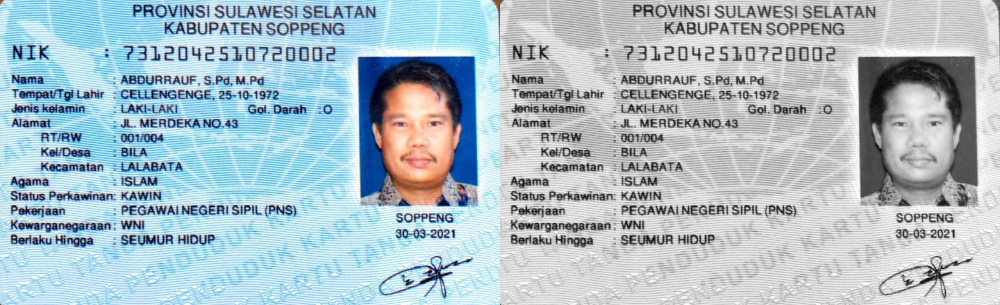

In [45]:
lightness_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    lightness = (int(np.max(original[y, x])) + int(np.min(original[y, x]))) / 2
    for c in range(original.shape[2]):
      lightness_image[y, x, c] = lightness

final_frame = cv.hconcat((original, lightness_image))
cv2_imshow(final_frame)

### c. Luminance

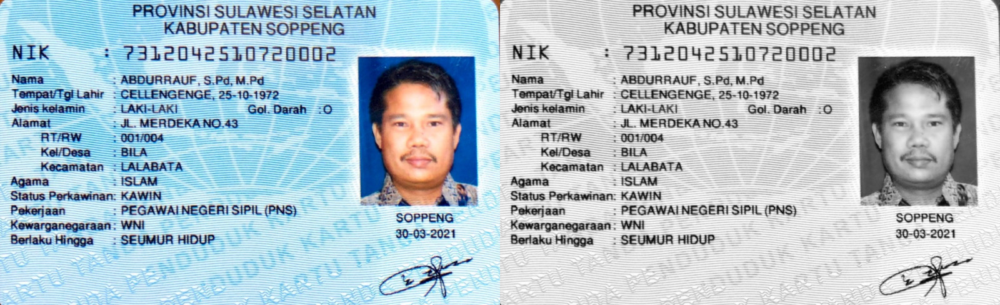

In [46]:
luminance_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      luminance_image[y, x, c] = (0.21 * original[y, x, 0]) + (0.72 * original[y, x, 1]) + (0.07 * original[y, x, 2])

final_frame = cv.hconcat((original, luminance_image))
cv2_imshow(final_frame)

## 5. Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal, tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna biru menjadi grayscale seperti pada contoh berikut:

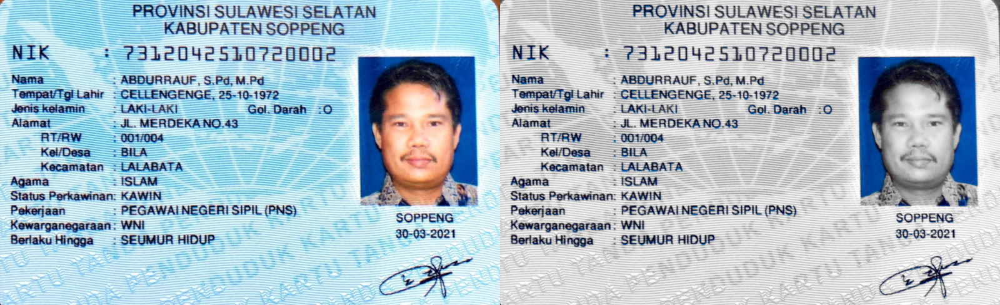

In [71]:
original = cv.imread('/content/drive/MyDrive/PCVK/Images/KTP7.jpeg')

average_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      if (original[y, x, 2] > 64):
        average_image[y, x, c] = np.average(original[y, x])
      else:
        average_image[y, x, c] = original[y, x, c]

final_frame = cv.hconcat((original, average_image))
cv2_imshow(final_frame)